# **Network Stock Portfolio Optimization**

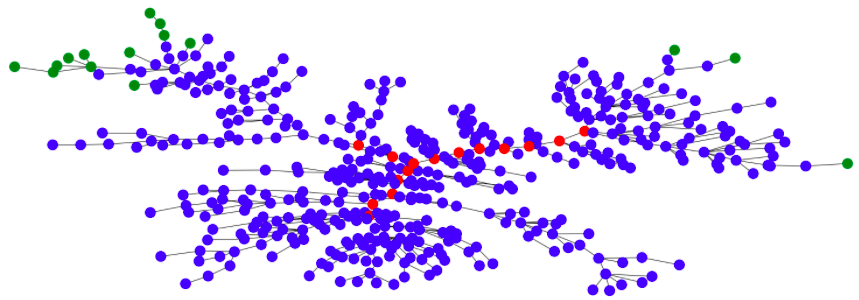

## **Context and Problem Statement**

Active investing in the asset management industry **aims to beat the stock market’s average returns**, for which portfolio managers track a particular index and try to beat that index by creating their own portfolios.

Portfolio construction involves selection of stocks that have a **higher probability of giving better returns** in comparison to the tracking index, like **S&P 500**. In this project, we will use the concept of Network Analysis to select a basket of stocks and create two portfolios. We will then simulate portfolio value by investing a certain amount, keeping the portfolio for an entire year and we will then compare it against the S&P 500 index.

In this project we will try to follow the approach mentioned in the below research paper:

**[Dynamic portfolio strategy using a clustering
approach](https://arxiv.org/pdf/1608.03058.pdf)**

## **Proposed Approach**

- Collect the price data for all S&P 500 components from 2011 till 2020
- Compute log returns for the S&P 500 components for same time period
- Compute the **correlation matrix** for the above log returns
- Find out the **Top n central and peripheral stocks** based on the following network topological parameters:
    - Degree centrality
    - Betweenness centrality
    - Distance on degree criterion
    - Distance on correlation criterion
    - Distance on distance criterion
- Simulate the performance of central and peripheral portfolios against the performance of S&P 500 for the year 2021    

## **Loading the Libraries**

We will need to first install the library - `pandas_datareader` using `!pip install pandas_datareader`

In [3]:
!pip install pandas_datareader

In [5]:
import tqdm
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import plotly.express as px
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import pandas_datareader.data as web
import os

import warnings
warnings.filterwarnings('ignore')

## **Getting the S&P 500 Components**

Beautiful Soup is a library that makes it easy to scrape information from web pages.

https://www.crummy.com/software/BeautifulSoup/bs4/doc/

In [7]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'

# Always include a User-Agent to avoid being blocked
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/122.0.0.0 Safari/537.36'}
resp = requests.get(url, headers=headers)

# Parse with BeautifulSoup
soup = BeautifulSoup(resp.text, 'lxml')

# Verify which tables are present
tables = soup.find_all('table')
print(f"Found {len(tables)} tables on the page")

# The S&P 500 table is usually the first one
table = tables[0]

# Convert to DataFrame for convenience
df = pd.read_html(str(table))[0]

# Extract tickers
tickers = df['Symbol'].str.replace('.', '-', regex=False).tolist()

print(f"Extracted {len(tickers)} tickers.")
print(tickers[:10])

Found 2 tables on the page
Extracted 503 tickers.
['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A']


## **Getting the Price Data for all the S&P 500 components in the last 10 years**

In [6]:
# price_data = web.DataReader(tickers, 'yahoo', start='2011-01-01', end='2020-12-31')  # We will get the dataset for yahoo
# price_data = price_data['Adj Close']    # we will get all the data points and we also get the volume not only the close price, open price
# price_data.to_csv('snp500_price_data_2011_to_2020.csv')

In [18]:
# Build path to file saved in Data fodler
main_dir = os.path.dirname(current_path)
file_path = os.path.join(main_dir, "Data", "snp500_price_data_2011_to_2020.csv")

df = pd.read_csv(file_path, index_col=[0])

print(df.head())

                  MMM       AOS        ABT  ABBV   ABMD        ACN       ATVI  \
Date                                                                            
2010-12-31  63.855606  8.113162  17.986767   NaN   9.61  39.143620  11.245819   
2011-01-03  64.218163  8.125947  17.952976   NaN   9.80  39.224346  11.318138   
2011-01-04  64.129395  8.100383  18.121916   NaN   9.80  38.966022  11.327178   
2011-01-05  64.129395  8.285738  18.121916   NaN  10.03  38.974094  11.110217   
2011-01-06  63.737186  8.289999  18.084377   NaN  10.05  39.119389  11.083097   

                  ADM       ADBE        ADP  ...        XEL       XLNX  XYL  \
Date                                         ...                              
2010-12-31  22.385578  30.780001  31.271172  ...  16.221039  23.216919  NaN   
2011-01-03  22.623722  31.290001  31.791464  ...  16.227924  23.569420  NaN   
2011-01-04  22.608845  31.510000  31.676586  ...  16.296804  23.665552  NaN   
2011-01-05  22.713020  32.220001  32.

In [19]:
df.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2010-12-31,63.855606,8.113162,17.986767,NaN,9.61,39.143620,11.245819,22.385578,30.780001,31.271172,...,16.221039,23.216919,NaN,28.547478,37.990002,49.212429,21.089169,NaN,NaN,NaN
2011-01-03,64.218163,8.125947,17.952976,NaN,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,...,16.227924,23.569420,NaN,28.570745,38.200001,50.395058,21.907326,NaN,NaN,NaN
2011-01-04,64.129395,8.100383,18.121916,NaN,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,...,16.296804,23.665552,NaN,28.134232,37.840000,49.725819,21.550467,NaN,NaN,NaN
2011-01-05,64.129395,8.285738,18.121916,NaN,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,...,16.200367,23.745670,NaN,28.268110,37.799999,49.762482,21.672325,NaN,NaN,NaN
2011-01-06,63.737186,8.289999,18.084377,NaN,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,...,16.186602,24.146229,NaN,28.465996,37.480000,48.222305,21.611391,NaN,NaN,NaN


## **Missing Data due to Index Rebalancing**

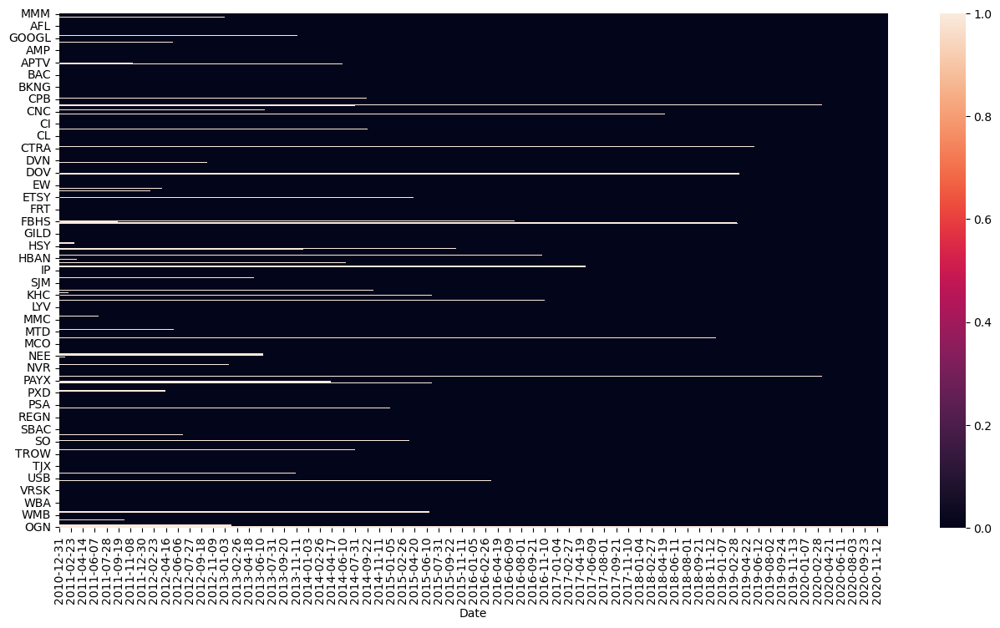

In [23]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data.T.isnull());

The missing data is due to the fact that **certain stocks may move out of the S&P 500** and **certain stocks may enter the S&P 500** in this respective timeframe.

In [21]:
price_data_cleaned = price_data.dropna(axis=1) # dropping null values columnwise

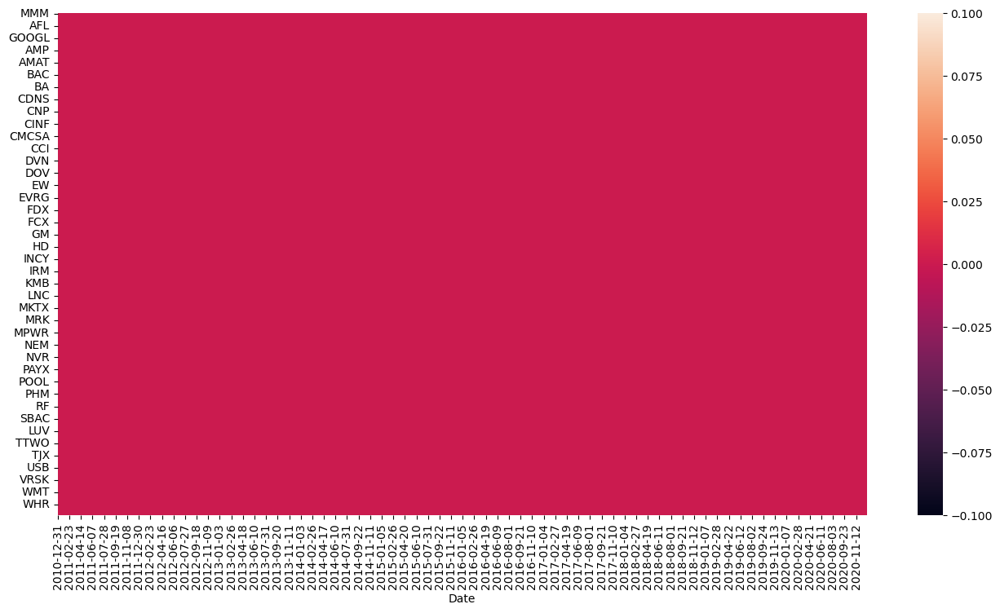

In [22]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data_cleaned.T.isnull());

The null values are removed - the data is clean and the plot also helps in finding that there are no missing values.

## **Getting Yearwise Data**

In [24]:
def get_year_wise_snp_500_data(data, year):
    year_wise_data = data.loc['{}-01-01'.format(year):'{}-12-31'.format(year)]

    return year_wise_data

In [25]:
# Getting year wise data of S&P stocks from 2011 to 2020
snp_500_2011 = get_year_wise_snp_500_data(price_data_cleaned, 2011)
snp_500_2012 = get_year_wise_snp_500_data(price_data_cleaned, 2012)
snp_500_2013 = get_year_wise_snp_500_data(price_data_cleaned, 2013)
snp_500_2014 = get_year_wise_snp_500_data(price_data_cleaned, 2014)
snp_500_2015 = get_year_wise_snp_500_data(price_data_cleaned, 2015)
snp_500_2016 = get_year_wise_snp_500_data(price_data_cleaned, 2016)
snp_500_2017 = get_year_wise_snp_500_data(price_data_cleaned, 2017)
snp_500_2018 = get_year_wise_snp_500_data(price_data_cleaned, 2018)
snp_500_2019 = get_year_wise_snp_500_data(price_data_cleaned, 2019)
snp_500_2020 = get_year_wise_snp_500_data(price_data_cleaned, 2020)

In [26]:
snp_500_2011

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,64.218163,8.125947,17.952976,9.800000,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-04,64.129395,8.100383,18.121916,9.800000,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-05,64.129395,8.285738,18.121916,10.030000,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-06,63.737186,8.289999,18.084377,10.050000,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
2011-01-07,63.803787,8.409311,18.159452,9.890000,39.183979,10.938456,23.777237,32.040001,32.507687,59.265705,...,65.689018,11.296103,92.953644,84.570557,16.331245,24.010040,28.821018,37.599998,48.213131,21.385098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,62.401131,8.806977,21.821796,18.469999,43.558022,11.196037,22.084383,28.290001,37.792553,67.537323,...,39.581589,15.226687,103.337746,82.537613,19.524267,26.499556,35.055527,36.520000,48.781536,14.242986
2011-12-27,62.461864,8.845891,21.903597,18.360001,43.590965,11.168506,22.069183,28.500000,37.869064,68.181442,...,36.047947,15.277890,103.761589,85.186325,19.825743,26.450407,35.215870,36.590000,48.845718,14.304041
2011-12-28,61.604034,8.612420,21.747778,18.250000,43.533318,11.131798,21.560009,28.020000,37.423878,67.546921,...,35.854633,14.956691,102.516556,81.952354,19.710886,26.188274,35.025822,35.700001,48.735703,14.033657


In [15]:
snp_500_2011.shift(1)

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,64.218163,8.125947,17.952976,9.800000,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-05,64.129395,8.100383,18.121916,9.800000,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-06,64.129395,8.285738,18.121916,10.030000,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-07,63.737186,8.289999,18.084377,10.050000,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,61.467400,8.679438,21.677664,18.520000,43.302727,10.920726,21.810799,27.889999,37.444744,66.700890,...,39.094479,15.007899,101.907288,81.066956,19.380699,26.450407,34.675449,36.380001,48.625694,14.085989
2011-12-27,62.401131,8.806977,21.821796,18.469999,43.558022,11.196037,22.084383,28.290001,37.792553,67.537323,...,39.581589,15.226687,103.337746,82.537613,19.524267,26.499556,35.055527,36.520000,48.781536,14.242986
2011-12-28,62.461864,8.845891,21.903597,18.360001,43.590965,11.168506,22.069183,28.500000,37.869064,68.181442,...,36.047947,15.277890,103.761589,85.186325,19.825743,26.450407,35.215870,36.590000,48.845718,14.304041


## **Computing the Daily Log Returns**

Statistically, **simple stock returns are always assumed to follow a Log Normal distribution**. It is therefore plausible to use properties of the Normal distribution in statistical estimation for Log returns, but not for the simple returns.

Stock Returns analysis is a time series analysis, in which you also take care of stationarity which is normally obtained from Log returns but not from simple returns.

In [16]:
# Calculating daily log returns by subtracting between two days with the help of shift function
log_returns_2011 = np.log(snp_500_2011.shift(1)) - np.log(snp_500_2011)
log_returns_2012 = np.log(snp_500_2012.shift(1)) - np.log(snp_500_2012)
log_returns_2013 = np.log(snp_500_2013.shift(1)) - np.log(snp_500_2013)
log_returns_2014 = np.log(snp_500_2014.shift(1)) - np.log(snp_500_2014)
log_returns_2015 = np.log(snp_500_2015.shift(1)) - np.log(snp_500_2015)
log_returns_2016 = np.log(snp_500_2016.shift(1)) - np.log(snp_500_2016)
log_returns_2017 = np.log(snp_500_2017.shift(1)) - np.log(snp_500_2017)
log_returns_2018 = np.log(snp_500_2018.shift(1)) - np.log(snp_500_2018)
log_returns_2019 = np.log(snp_500_2019.shift(1)) - np.log(snp_500_2019)
log_returns_2020 = np.log(snp_500_2020.shift(1)) - np.log(snp_500_2020)

## **Computing the Correlation of Returns**

In [17]:
# Computing adjacency matrix:
return_correlation_2011 = log_returns_2011.corr()
return_correlation_2012 = log_returns_2012.corr()
return_correlation_2013 = log_returns_2013.corr()
return_correlation_2014 = log_returns_2014.corr()
return_correlation_2015 = log_returns_2015.corr()
return_correlation_2016 = log_returns_2016.corr()
return_correlation_2017 = log_returns_2017.corr()
return_correlation_2018 = log_returns_2018.corr()
return_correlation_2019 = log_returns_2019.corr()
return_correlation_2020 = log_returns_2020.corr()

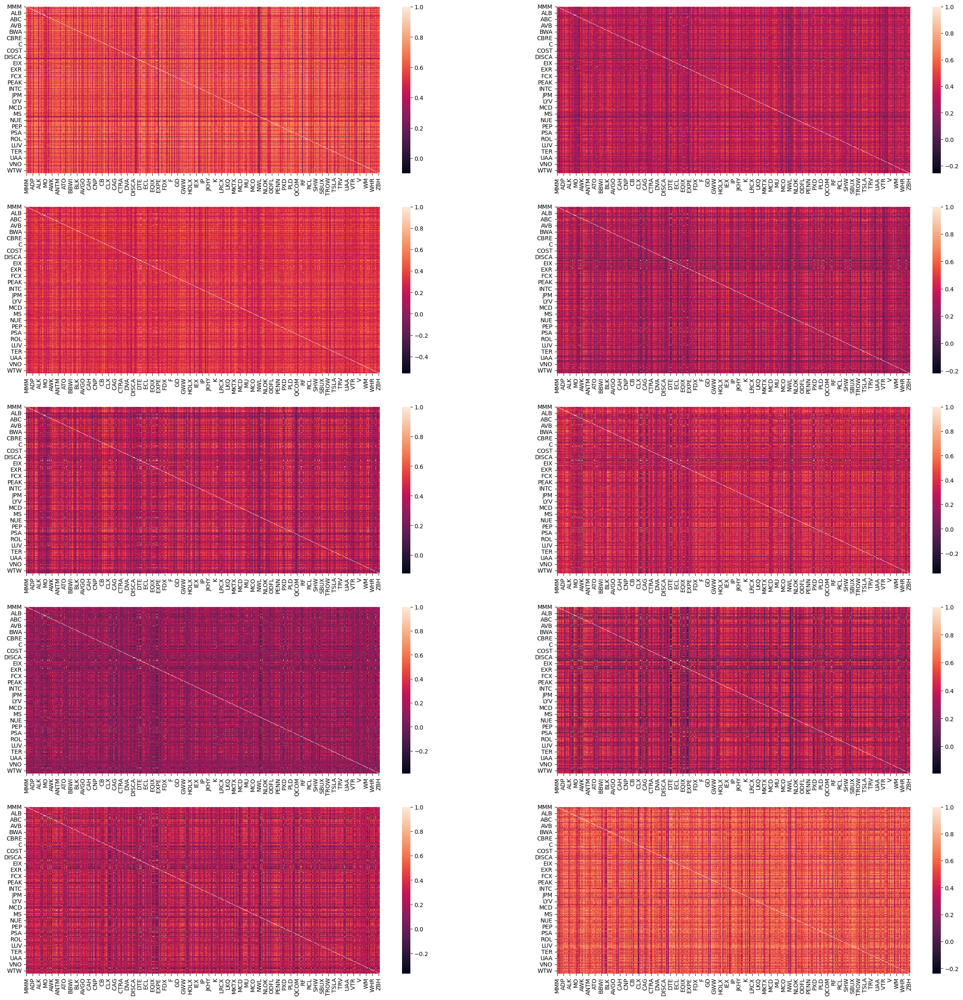

In [18]:
figure, axes = plt.subplots(5, 2, figsize=(30, 30))
sns.heatmap(return_correlation_2011, ax=axes[0, 0]);
sns.heatmap(return_correlation_2012, ax=axes[0, 1]);
sns.heatmap(return_correlation_2013, ax=axes[1, 0]);
sns.heatmap(return_correlation_2014, ax=axes[1, 1]);
sns.heatmap(return_correlation_2015, ax=axes[2, 0]);
sns.heatmap(return_correlation_2016, ax=axes[2, 1]);
sns.heatmap(return_correlation_2017, ax=axes[3, 0]);
sns.heatmap(return_correlation_2018, ax=axes[3, 1]);
sns.heatmap(return_correlation_2019, ax=axes[4, 0]);
sns.heatmap(return_correlation_2020, ax=axes[4, 1]);

## **Inferences**

The first plot for the year 2011 shows that there is high correlation among the stocks. It shows that since in 2011 there was a market crash and there was volatility in the market, the prices of the stock went down along with the other stocks and this is the reason for high correlation.

Similarly in 2012, 2014 and 2017 the market is kind of stable, and hence the correlation among stocks is low.

In 2020, due to the COVID pandemic and the volatility in the market, the prices of the stock went down or up along with other stocks, and this is the reason for high correlation.

From this we can infer that, **In stable market conditions, correlation matrices have low correlation values whereas in critical market conditions, correlation matrices have high correlation values.**

## **Creating Graphs**

In [19]:
graph_2011 = nx.Graph(return_correlation_2011)

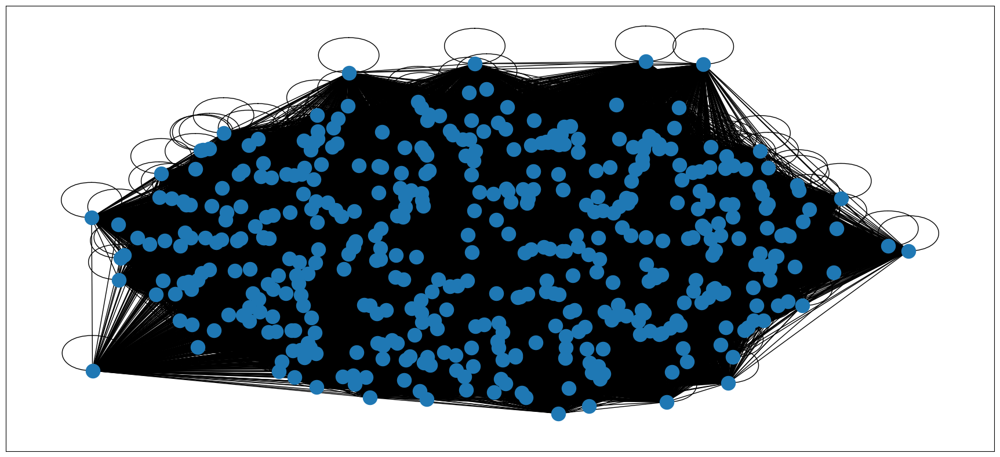

In [20]:
figure = plt.figure(figsize=(22, 10))
nx.draw_networkx(graph_2011, with_labels=False)

This is a **fully connected network** as we created it using the correlation matrix.

A fully connected network means every variable has connections with all the other variables in the network and will also have self-loops.

## **Filtering Graphs using MST**

**MST - Minimum Spanning Tree**

A minimum spanning tree (MST) or minimum weight spanning tree is a subset of the edges of a connected, edge-weighted undirected graph that connects all the vertices together, without any cycles and with the minimum possible total edge weight.That is, it is a spanning tree whose sum of edge weights is as small as possible.

**MST** is one of the popular techniques to eliminate the redundancies and noise and meanwhile maintain the significant links in the network.

While removing redundancy and noise in the data using MST, we might lose some information as well.

You can find more on MST [here](https://visualgo.net/en/mst)

In [21]:
distance_2011 = np.sqrt(2 * (1 - return_correlation_2011))
distance_2012 = np.sqrt(2 * (1 - return_correlation_2012))
distance_2013 = np.sqrt(2 * (1 - return_correlation_2013))
distance_2014 = np.sqrt(2 * (1 - return_correlation_2014))
distance_2015 = np.sqrt(2 * (1 - return_correlation_2015))
distance_2016 = np.sqrt(2 * (1 - return_correlation_2016))
distance_2017 = np.sqrt(2 * (1 - return_correlation_2017))
distance_2018 = np.sqrt(2 * (1 - return_correlation_2018))
distance_2019 = np.sqrt(2 * (1 - return_correlation_2019))
distance_2020 = np.sqrt(2 * (1 - return_correlation_2020))

Before the construction of the MST graph, **the correlation coefficient is converted into a distance.**

In [22]:
distance_2011_graph = nx.Graph(distance_2011)
distance_2012_graph = nx.Graph(distance_2012)
distance_2013_graph = nx.Graph(distance_2013)
distance_2014_graph = nx.Graph(distance_2014)
distance_2015_graph = nx.Graph(distance_2015)
distance_2016_graph = nx.Graph(distance_2016)
distance_2017_graph = nx.Graph(distance_2017)
distance_2018_graph = nx.Graph(distance_2018)
distance_2019_graph = nx.Graph(distance_2019)
distance_2020_graph = nx.Graph(distance_2020)

In [23]:
graph_2011_filtered = nx.minimum_spanning_tree(distance_2011_graph)
graph_2012_filtered = nx.minimum_spanning_tree(distance_2012_graph)
graph_2013_filtered = nx.minimum_spanning_tree(distance_2013_graph)
graph_2014_filtered = nx.minimum_spanning_tree(distance_2014_graph)
graph_2015_filtered = nx.minimum_spanning_tree(distance_2015_graph)
graph_2016_filtered = nx.minimum_spanning_tree(distance_2016_graph)
graph_2017_filtered = nx.minimum_spanning_tree(distance_2017_graph)
graph_2018_filtered = nx.minimum_spanning_tree(distance_2018_graph)
graph_2019_filtered = nx.minimum_spanning_tree(distance_2019_graph)
graph_2020_filtered = nx.minimum_spanning_tree(distance_2020_graph)

We choose the MST method to filter out the network graph in each window so as to eliminate the redundancies and noise, and still maintain significant links.

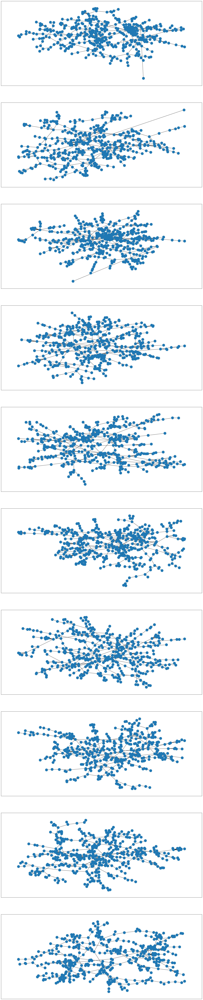

In [24]:
figure, axes = plt.subplots(10, 1, figsize=(24, 120))
nx.draw_networkx(graph_2011_filtered, with_labels=False, ax=axes[0])
nx.draw_networkx(graph_2012_filtered, with_labels=False, ax=axes[1])
nx.draw_networkx(graph_2013_filtered, with_labels=False, ax=axes[2])
nx.draw_networkx(graph_2014_filtered, with_labels=False, ax=axes[3])
nx.draw_networkx(graph_2015_filtered, with_labels=False, ax=axes[4])
nx.draw_networkx(graph_2016_filtered, with_labels=False, ax=axes[5])
nx.draw_networkx(graph_2017_filtered, with_labels=False, ax=axes[6])
nx.draw_networkx(graph_2018_filtered, with_labels=False, ax=axes[7])
nx.draw_networkx(graph_2019_filtered, with_labels=False, ax=axes[8])
nx.draw_networkx(graph_2020_filtered, with_labels=False, ax=axes[9])

On plotting the graphs, we see that the network looks different every year, and no two yearwise graphs look very similar.

## **Computing Graph Statistics over Time**

In [25]:
average_degree_connectivity = []
average_shortest_path_length = []
year = [2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

for graph in [graph_2011_filtered, graph_2012_filtered, graph_2013_filtered, graph_2014_filtered, graph_2015_filtered,
             graph_2016_filtered, graph_2017_filtered, graph_2018_filtered, graph_2019_filtered, graph_2020_filtered]:
    average_shortest_path_length.append(nx.average_shortest_path_length(graph))

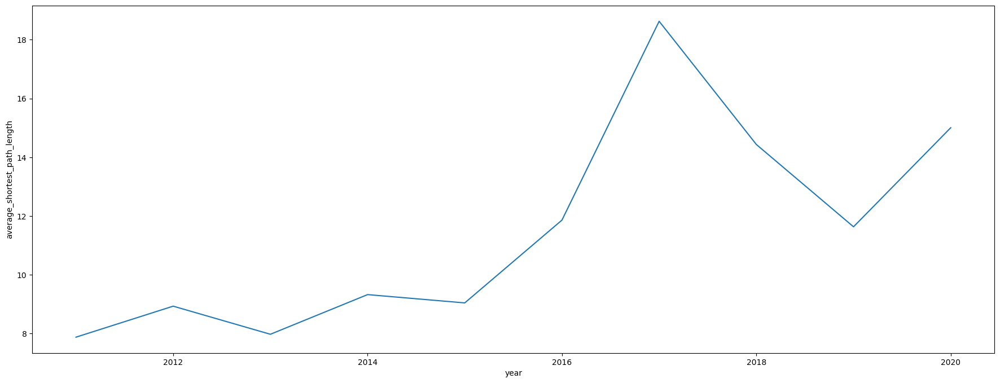

In [26]:
figure = plt.figure(figsize=(22, 8))
sns.lineplot(x='year', y='average_shortest_path_length',
             data=pd.DataFrame({'year': year, 'average_shortest_path_length': average_shortest_path_length}));

From the above plot we can see that the shortest path length was more stable till 2015 but there was significant increment in 2016 and 2017 and again there was a decrement in 2018. In 2020 there an increment again. May be this has some correlation with the financial queries.

## **Portfolio Construction**

In [27]:
log_returns_2011_till_2020 = np.log(price_data_cleaned.shift(1)) - np.log(price_data_cleaned)
return_correlation_2011_till_2020 = log_returns_2011_till_2020.corr()

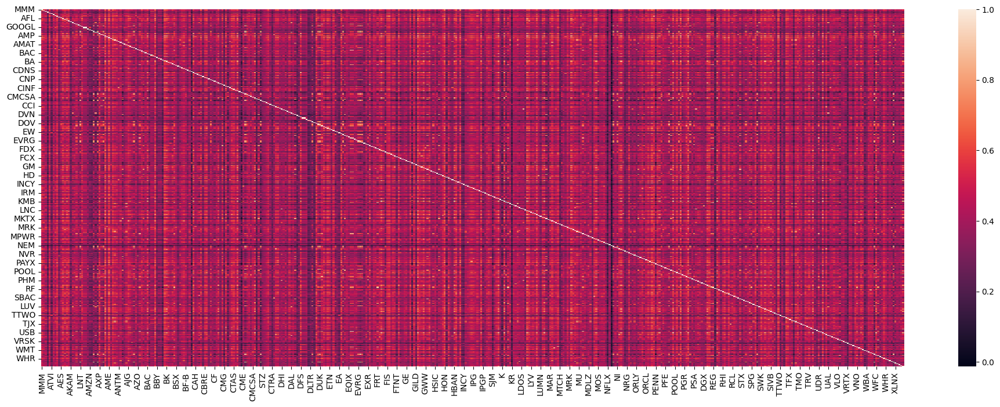

In [28]:
figure = plt.figure(figsize=(24, 8))
sns.heatmap(return_correlation_2011_till_2020);

In [29]:
distance_2011_till_2020 = np.sqrt(2 * (1 - return_correlation_2011_till_2020))
distance_2011_till_2020_graph = nx.Graph(distance_2011_till_2020)
distance_2011_till_2020_graph_filtered = nx.minimum_spanning_tree(distance_2011_till_2020_graph)

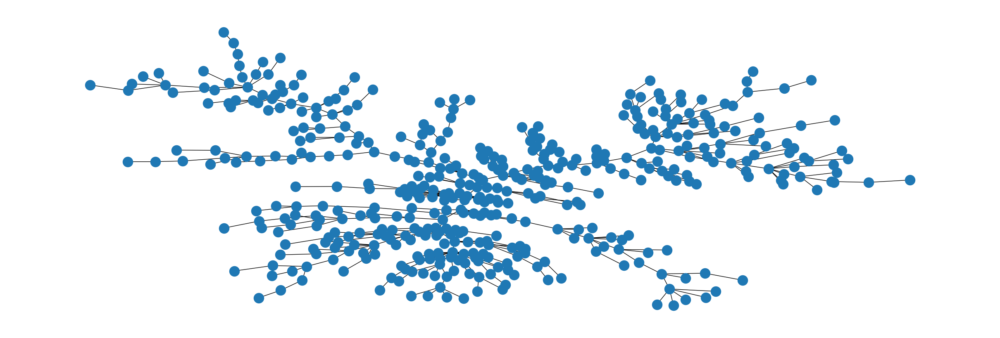

In [30]:
figure = plt.figure(figsize=(24, 8))
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered, with_labels=False)

In [31]:
degree_centrality = nx.degree_centrality(distance_2011_till_2020_graph_filtered)
closeness_centrality = nx.closeness_centrality(distance_2011_till_2020_graph_filtered)
betweenness_centrality = nx.betweenness_centrality(distance_2011_till_2020_graph_filtered)
eigenvector_centrality=nx.eigenvector_centrality_numpy(distance_2011_till_2020_graph_filtered)

In [32]:
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'degree_centrality': values}).sort_values('degree_centrality', ascending=False)
px.bar(data_frame=dc_data, x='stocks', y='degree_centrality', template='plotly_dark')

**Degree centrality** is the simplest centrality measure. It
defines the relative significance of a stock in terms of the
**number of edges incident upon it.** The stocks with the high
scores will influence the behavior of many other
stocks which are directly connected to it.

Based on this
measure, **HON has the highest number of edges with other
stocks and hence the highest degree centrality.**

In [33]:
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality',
                                                                                       ascending=False)
px.bar(data_frame=cc_data, x='stocks', y='closeness_centrality', template='plotly_dark')

**Closeness centrality** also involves the shortest path
between all possible pairs of stocks on a network.

It is
defined as the average number of shortest paths between a
stock and all other stocks reachable from it.

In [34]:
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality',
                                                                                       ascending=False)
px.bar(data_frame=bc_data, x='stocks', y='betweenness_centrality', template='plotly_dark')

**Betweenness centrality** is the sum of the fraction of all possible shortest paths between any stocks that pass through a stock. It is used to **quantify the control of a stock on information flow in the network.**

So, the stock with the highest score is considered a significant stock in terms of its role in coordinating the information among stocks.

## **Selecting Stocks based on Network Topological Parameters**

In [35]:
# we already computed degree centrality above

# we already computed betweenness centrality above

# distance on degree criterion
distance_degree_criteria = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)
for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_degree_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_largest_degree_centrality)

# distance on correlation criterion
distance_correlation_criteria = {}
sum_correlation = {}

for node in distance_2011_till_2020_graph_filtered.nodes():
    neighbors = nx.neighbors(distance_2011_till_2020_graph_filtered, node)
    sum_correlation[node] = sum(return_correlation_2011_till_2020[node][neighbor] for neighbor in neighbors)

node_with_highest_correlation = max(sum_correlation, key=sum_correlation.get)

for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_correlation_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_highest_correlation)

# distance on distance criterion
distance_distance_criteria = {}
mean_distance = {}

for node in distance_2011_till_2020_graph_filtered.nodes():
    nodes = list(distance_2011_till_2020_graph_filtered.nodes())
    nodes.remove(node)
    distance_distance = [nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node, ns) for ns in nodes]
    mean_distance[node] = np.mean(distance_distance)

node_with_minimum_mean_distance = min(mean_distance, key=mean_distance.get)

for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_minimum_mean_distance)

**Distance refers to the smallest length from a node to the central node of the network**.

Here,
three types of definitions of central node are introduced to reduce the error caused by a single
method.

Therefore three types of distances are described here.

**1. Distance on degree criterion** (Ddegree), the central node is the one that has the largest degree.

**2. Distance on correlation criterion** (Dcorrelation), the central node is the one with the highest value of the sum of correlation coefficients with its neighbors.

**3. Distance on distance criterion** (Ddistance), the central node is the one that produces the lowest value for the mean distance.

In [36]:
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
node_stats['betweenness_centrality'] = betweenness_centrality.values()

node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])

node_stats['distance_degree_criteria'] = distance_degree_criteria.values()
node_stats['distance_correlation_criteria'] = distance_correlation_criteria.values()
node_stats['distance_distance_criteria'] = distance_distance_criteria.values()
node_stats['average_distance'] = (node_stats['distance_degree_criteria'] + node_stats['distance_correlation_criteria'] +
                                  node_stats['distance_distance_criteria']) / 3



In [37]:
node_stats.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
MMM,0.002227,0.000000,0.001114,2,2,7,3.666667
AOS,0.004454,0.022073,0.013264,6,6,5,5.666667
ABT,0.008909,0.056584,0.032746,9,9,8,8.666667
ABMD,0.002227,0.000000,0.001114,10,10,9,9.666667
ACN,0.006682,0.008899,0.007790,16,16,9,13.666667


We use the parameters defined above to select the portfolios.

**The nodes with the largest 10% of degree or betweenness centrality are chosen to be in the central portfolio.**

**The nodes whose degree equals to 1 or betweenness centrality equals to 0 are chosen to be in the peripheral portfolio.**


Similarly, we define the node's ranking in the top 10% of distance as the stocks of the peripheral portfolios, and the bottom 10% as the stocks of the central portfolios.

The central portfolios and peripheral portfolios represent two opposite sides of correlation and agglomeration. Generally speaking, central stocks play a vital role in the market and impose a strong influence on other stocks. On the other hand, the correlations between peripheral stocks are weak and contain much more noise than those of the central stocks.

In [38]:
central_stocks = node_stats.sort_values('average_centrality', ascending=False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values]

In [39]:
peripheral_stocks = node_stats.sort_values('average_distance', ascending=False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values]

In [40]:
central_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
PRU,0.011136,0.639884,0.325510,7,7,0,4.666667
AMP,0.028953,0.540198,0.284576,5,5,2,4.000000
LNC,0.015590,0.526050,0.270820,6,6,1,4.333333
AME,0.020045,0.517430,0.268737,4,4,3,3.666667
GL,0.017817,0.452504,0.235160,8,8,1,5.666667
PH,0.031180,0.389924,0.210552,2,2,5,3.000000
EMR,0.006682,0.414403,0.210542,3,3,4,3.333333
TFC,0.008909,0.400791,0.204850,10,10,3,7.666667
USB,0.006682,0.391624,0.199153,9,9,2,6.666667
PNC,0.008909,0.353911,0.181410,11,11,4,8.666667


In [41]:
peripheral_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
CHD,0.002227,0.000000,0.001114,24,24,17,21.666667
CLX,0.004454,0.004454,0.004454,23,23,16,20.666667
CAG,0.002227,0.000000,0.001114,23,23,16,20.666667
CPB,0.004454,0.004454,0.004454,22,22,15,19.666667
K,0.002227,0.000000,0.001114,22,22,15,19.666667
HRL,0.002227,0.000000,0.001114,22,22,15,19.666667
SJM,0.002227,0.000000,0.001114,22,22,15,19.666667
KMB,0.004454,0.008889,0.006672,22,22,15,19.666667
ATO,0.002227,0.000000,0.001114,21,21,14,18.666667
MNST,0.002227,0.000000,0.001114,21,21,14,18.666667


### **Selecting the top 15 stocks for both Central Stocks and Peripheral Stocks**

In [42]:
color = []

for node in distance_2011_till_2020_graph_filtered:
    if node in central_portfolio:
        color.append('red')

    elif node in peripheral_portfolio:
        color.append('green')

    else:
        color.append('blue')

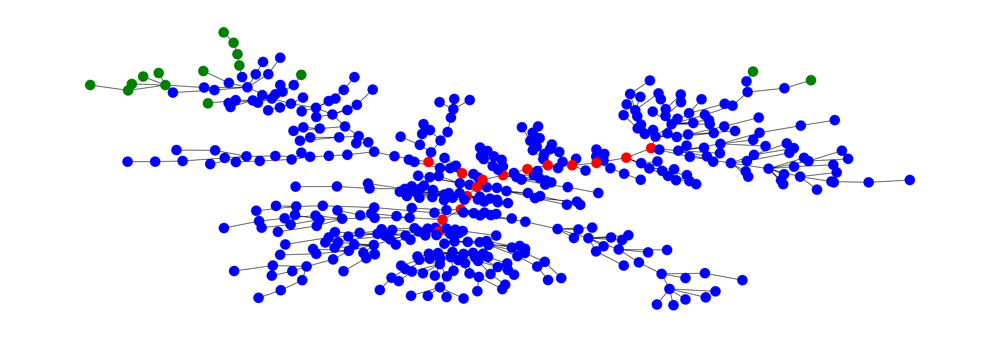

In [43]:
figure = plt.figure(figsize=(24, 8))
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered, with_labels=False, node_color=color)

Here, **the red stocks are the central portfolio stocks, and the green ones are the peripheral portfolio stocks.**

## **Performance Evalutation**

Here we evaluate the performance of the stocks by comparing the performance of the Central Portfolio, Peripheral and S&P 500 Stocks in 2021, and **finding out which portfolio performs the best.**

In [44]:
# collecting data for all S&P 500 components for the year 2021
# %time price_data_2021 = web.DataReader(tickers, 'yahoo', start='2021-01-01', end='2021-12-31')

In [45]:
#Reading data for 2021 S&P 500 stocks:
price_data_2021 = pd.read_csv('snp500_price_data_2021.csv', index_col=[0])
# price_data_2021 = price_data_2021['Adj Close']
# price_data_2021.to_csv('snp500_price_data_2021.csv')

In [46]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


In [47]:
snp_500_2021 = web.DataReader(['sp500'], 'fred', start='2021-01-01', end='2021-12-31')

In [48]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


In [49]:
# Removing NA values:
price_data_2021 = price_data_2021.dropna(axis=1)
snp_500_2021 = snp_500_2021.dropna()

In [50]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WTW,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,210.679993,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,203.699997,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,202.000000,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,203.699997,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,205.250000,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558


In [51]:
price_data_2021 = price_data_2021['2021-01-04':]

In [52]:
amount = 100000

central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = price_data_2021[stock]

portfolio_unit = central_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis=1) * share

peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = price_data_2021[stock]

portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis=1) * share

In [53]:
snp_500_2021_value = snp_500_2021 * (amount / snp_500_2021.iloc[0])

In [54]:
all_portfolios = snp_500_2021_value
all_portfolios['central_portfolio'] = central_portfolio_value.values
all_portfolios['peripheral_portfolio'] = peripheral_portfolio_value.values

In [55]:
# all_portfolios = pd.concat([snp_500_2021_value, central_portfolio_value, peripheral_portfolio_value], axis=1)
# all_portfolios.columns = ['snp500', 'central_portfolio', 'peripheral_portfolio']

In [56]:
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
DATE,,,
2021-01-04,100000.000000,100000.000000,100000.000000
2021-01-05,100708.253955,100426.138652,100062.699137
2021-01-06,101283.288071,104249.598589,100581.162028
2021-01-07,102787.077946,105184.349194,100174.816809
2021-01-08,103351.573372,105127.033059,100190.990005


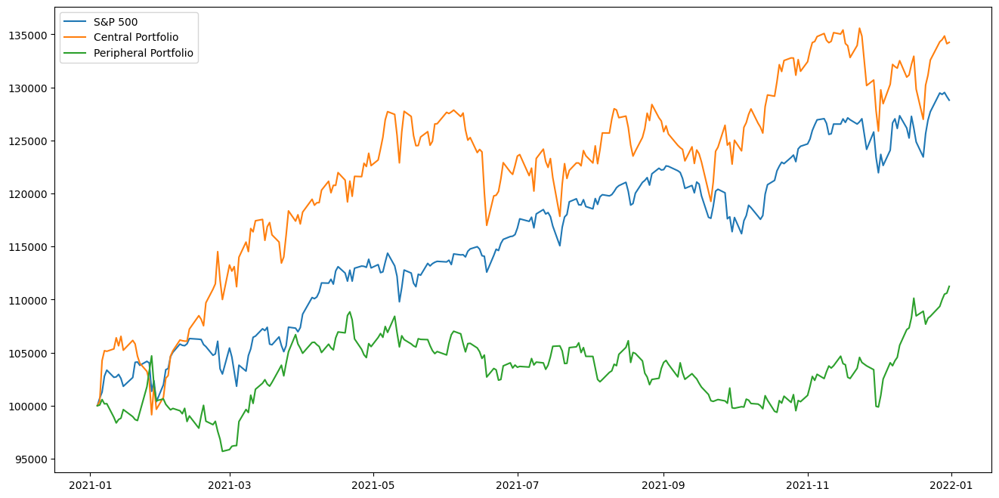

In [57]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')
plt.show()

As seen from the above plot, it is clear that **the Central Portfolio stocks perform better and the Peripheral Portfolio stocks perform poorer in comparison to the S&P 500 stocks in 2021.**

   Both the portfolios have their own features under different market conditions.
   
   Generally, **in stable market conditions Central Portfolio Stocks will perform better whereas Peripheral Portfolio Stocks will perform better in crisis market conditions**. This is due to peripheral portfolio stocks are kind of having a weak correlation so they will not be impacted by all other stocks that were present in our network.
   
   We can rebalance our stocks portfolio by using the network analysis.